In [1]:
!pip install pyyaml==5.1

import torch
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print("torch: ", TORCH_VERSION, "; cuda: ", CUDA_VERSION)
# Install detectron2 that matches the above pytorch version
# See https://detectron2.readthedocs.io/tutorials/install.html for instructions
!pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/$CUDA_VERSION/torch$TORCH_VERSION/index.html
# If there is not yet a detectron2 release that matches the given torch + CUDA version, you need to install a different pytorch.

# exit(0)  # After installation, you may need to "restart runtime" in Colab. This line can also restart runtime

torch:  1.10 ; cuda:  cu111
Looking in links: https://dl.fbaipublicfiles.com/detectron2/wheels/cu111/torch1.10/index.html


In [2]:
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import os, json, cv2, random
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

import os
from xml.etree import ElementTree
from detectron2.structures import BoxMode
from detectron2.utils.visualizer import ColorMode
from detectron2.engine import DefaultTrainer
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader

In [2]:
!git clone https://github.com/experiencor/kangaroo.git

Cloning into 'kangaroo'...
remote: Enumerating objects: 334, done.
remote: Total 334 (delta 0), reused 0 (delta 0), pack-reused 334
Receiving objects: 100% (334/334), 18.39 MiB | 31.97 MiB/s, done.
Resolving deltas: 100% (158/158), done.


In [3]:
def extract_bounding_box(filename):
    tree = ElementTree.parse(filename)
    root = tree.getroot()
    boxes = list()
    for box in root.findall('.//bndbox'):
      xmin = int(box.find('xmin').text)
      ymin = int(box.find('ymin').text)
      xmax = int(box.find('xmax').text)
      ymax = int(box.find('ymax').text)
      boxes.append([xmin, ymin, xmax, ymax])
    width = int(root.find('.//size/width').text)
    height = int(root.find('.//size/height').text)
    return boxes, width, height

In [4]:
def get_kangaroo_dict(dataset_dir, is_training=False):
    img_dir = dataset_dir + "/images/"
    annotations_dir = dataset_dir + "/annots/"
    dataset_dicts = []

    for filename in os.listdir(img_dir):
        img_id = filename[:-4]
        if img_id in ['00090']:
            continue
        if is_training and int(img_id) >= 150:
            continue
        if not is_training and int(img_id) < 150:
            continue
        record = {}
        img_path = img_dir + filename
        annotation_path = annotations_dir + img_id + ".xml"
        boxes, width, height = extract_bounding_box(annotation_path)
        record["file_name"] = img_path
        record["image_id"] = int(img_id)
        record["height"] = height
        record["width"] = width
        annotations = []
        for box in boxes:
            px = [box[0], box[0], box[2], box[2]]
            py = [box[1], box[3], box[3], box[1]]
            poly = [(x + 0.5, y + 0.5) for x, y in zip(px, py)]
            poly = [p for x in poly for p in x]
            annotations.append({
                "bbox": box,
                "bbox_mode": BoxMode.XYXY_ABS,
                "segmentation": [poly],
                "category_id": 0
            })
        record["annotations"] = annotations
        dataset_dicts.append(record)
    return dataset_dicts


for d in ["train", "val"]:
    is_training = d == "train"
    if ("kangaroo_" + d in DatasetCatalog.keys()):
        DatasetCatalog.remove("kangaroo_" + d)
    DatasetCatalog.register("kangaroo_" + d, lambda d=d: get_kangaroo_dict("kangaroo", is_training))
    MetadataCatalog.get("kangaroo_" + d).set(thing_classes=["kangaroo"])
kangaroo_metadata = MetadataCatalog.get("kangaroo_train")

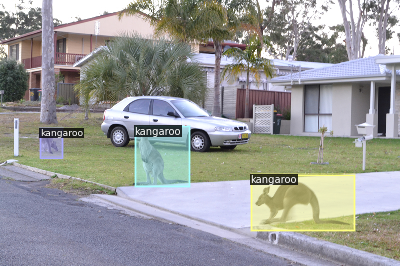

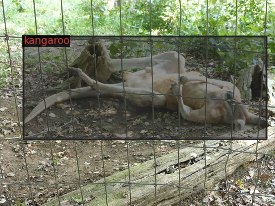

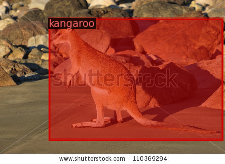

In [5]:
kangaroo_dataset_train = get_kangaroo_dict("kangaroo", True)
for d in random.sample(kangaroo_dataset_train, 3):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=kangaroo_metadata, scale=0.5)
    out = visualizer.draw_dataset_dict(d)
    cv2_imshow(out.get_image()[:, :, ::-1])

In [6]:
kangaroo_cfg = get_cfg()
kangaroo_cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
kangaroo_cfg.DATASETS.TRAIN = ("kangaroo_train",)
kangaroo_cfg.DATASETS.TEST = ()
kangaroo_cfg.DATALOADER.NUM_WORKERS = 2
kangaroo_cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")  # Let training initialize from model zoo
kangaroo_cfg.SOLVER.IMS_PER_BATCH = 2
kangaroo_cfg.SOLVER.BASE_LR = 0.00025  # pick a good LR
kangaroo_cfg.SOLVER.MAX_ITER = 1000    # 300 iterations seems good enough for this toy dataset; you will need to train longer for a practical dataset
kangaroo_cfg.SOLVER.STEPS = []        # do not decay learning rate
kangaroo_cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128   # faster, and good enough for this toy dataset (default: 512)
kangaroo_cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1  # only has one class (ballon). (see https://detectron2.readthedocs.io/tutorials/datasets.html#update-the-config-for-new-datasets)
# NOTE: this config means the number of classes, but a few popular unofficial tutorials incorrect uses num_classes+1 here.

os.makedirs(kangaroo_cfg.OUTPUT_DIR, exist_ok=True)
kangaroo_trainer = DefaultTrainer(kangaroo_cfg) 
kangaroo_trainer.resume_or_load(resume=False)
kangaroo_trainer.train()

RuntimeError: ignored

In [ ]:
# Look at training curves in tensorboard:
%load_ext tensorboard
%tensorboard --logdir output

In [30]:
kangaroo_cfg.MODEL.WEIGHTS = os.path.join(kangaroo_cfg.OUTPUT_DIR, "model_final.pth")  # path to the model we just trained
kangaroo_cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7   # set a custom testing threshold
kangaroo_predictor = DefaultPredictor(kangaroo_cfg)

/usr/local/lib/python3.7/dist-packages/detectron2/structures/image_list.py:88: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  max_size = (max_size + (stride - 1)) // stride * stride


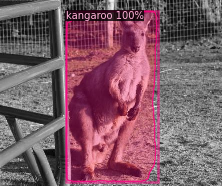

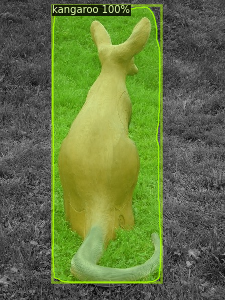

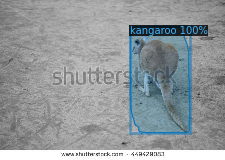

In [40]:
kangaroo_dataset_test = get_kangaroo_dict("kangaroo", False)
for d in random.sample(kangaroo_dataset_test, 3):    
    im = cv2.imread(d["file_name"])
    outputs = kangaroo_predictor(im)  # format is documented at https://detectron2.readthedocs.io/tutorials/models.html#model-output-format
    v = Visualizer(im[:, :, ::-1],
                   metadata=kangaroo_metadata, 
                   scale=0.5, 
                   instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels. This option is only available for segmentation models
    )
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2_imshow(out.get_image()[:, :, ::-1])

In [41]:
!wget https://images.immediate.co.uk/production/volatile/sites/23/2018/09/kangaroo_DirkFreder_iStock_623-18af7bd.jpg?quality=90&resize=768,574

--2021-11-16 22:20:44--  https://images.immediate.co.uk/production/volatile/sites/23/2018/09/kangaroo_DirkFreder_iStock_623-18af7bd.jpg?quality=90
Resolving images.immediate.co.uk (images.immediate.co.uk)... 151.101.2.133, 151.101.66.133, 151.101.130.133, ...
Connecting to images.immediate.co.uk (images.immediate.co.uk)|151.101.2.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 62585 (61K) [image/jpeg]
Saving to: ‘kangaroo_DirkFreder_iStock_623-18af7bd.jpg?quality=90’

kangaroo_DirkFreder 100%[===================>]  61.12K  --.-KB/s    in 0.01s   

2021-11-16 22:20:44 (5.25 MB/s) - ‘kangaroo_DirkFreder_iStock_623-18af7bd.jpg?quality=90’ saved [62585/62585]



In [42]:
!ls

 kangaroo						  output
'kangaroo_DirkFreder_iStock_623-18af7bd.jpg?quality=90'   sample_data


/usr/local/lib/python3.7/dist-packages/detectron2/structures/image_list.py:88: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  max_size = (max_size + (stride - 1)) // stride * stride


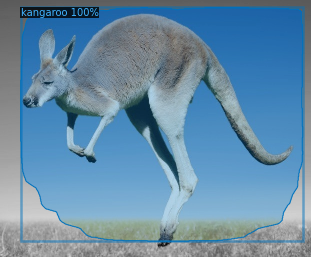

In [43]:
im = cv2.imread("kangaroo_DirkFreder_iStock_623-18af7bd.jpg?quality=90")
outputs = kangaroo_predictor(im)  # format is documented at https://detectron2.readthedocs.io/tutorials/models.html#model-output-format
v = Visualizer(im[:, :, ::-1],
                metadata=kangaroo_metadata, 
                scale=0.5, 
                instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels. This option is only available for segmentation models
)
out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2_imshow(out.get_image()[:, :, ::-1])

### Tree data set

In [3]:
# https://github.com/weecology/DeepForest or https://deepforest.readthedocs.io/en/latest/landing.html for trained model
# https://github.com/weecology/NeonTreeEvaluation figures to train and evaluate
# https://github.com/weecology/NeonTreeEvaluation_package benchmark to test model against
# carbon estimates https://www.fao.org/3/w4095e/w4095e06.htm
# training tiles https://zenodo.org/record/5593238#.YZR6jL3MLzc


In [4]:
!git clone https://github.com/weecology/NeonTreeEvaluation.git

Cloning into 'NeonTreeEvaluation'...
remote: Enumerating objects: 16997, done.
remote: Counting objects: 100% (142/142), done.
remote: Compressing objects: 100% (99/99), done.
remote: Total 16997 (delta 80), reused 89 (delta 43), pack-reused 16855
Receiving objects: 100% (16997/16997), 5.07 GiB | 20.70 MiB/s, done.
Resolving deltas: 100% (3164/3164), done.
Checking out files: 100% (9099/9099), done.


In [50]:
import glob

def get_annotations():
  annotations = {}
  for file in glob.glob("NeonTreeEvaluation/annotations/*.xml"):
    annotations[file] = []
  return annotations


In [105]:
import os

def map_images_to_annotations(annotations):
  for annotation in annotations:
    rgb_filename = "NeonTreeEvaluation/evaluation/RGB/" + os.path.basename(annotation).replace(".xml", ".tif")
    chm_filename = "NeonTreeEvaluation/evaluation/CHM/" + os.path.basename(annotation).replace(".xml", "_CHM.tif")
    hyperspectral_filename = "NeonTreeEvaluation/evaluation/Hyperspectral/" + os.path.basename(annotation).replace(".xml", "_hyperspectral.tif")
    if (os.path.exists(rgb_filename)):
      annotations[annotation].append(rgb_filename)
    # if (os.path.exists(hyperspectral_filename)):
      # annotations[annotation].append(hyperspectral_filename)
    # if (os.path.exists(chm_filename)):
      # annotations[annotation].append(chm_filename)
  return annotations

In [106]:
def remove_unused_annotations_from_map(annotations):
  keys = []
  for key in annotations:
    if len(annotations[key]) == 0:
      keys.append(key)
  
  for key in keys:
    annotations.pop(key)
  return annotations

In [107]:
tree_annotations = get_annotations()
tree_annotations = map_images_to_annotations(tree_annotations)
tree_annotations = remove_unused_annotations_from_map(tree_annotations)

In [108]:
def extract_bounding_box(filename):
    tree = ElementTree.parse(filename)
    root = tree.getroot()
    boxes = list()
    for box in root.findall('.//bndbox'):
      xmin = int(box.find('xmin').text)
      ymin = int(box.find('ymin').text)
      xmax = int(box.find('xmax').text)
      ymax = int(box.find('ymax').text)
      boxes.append([xmin, ymin, xmax, ymax])
    width = int(root.find('.//size/width').text)
    height = int(root.find('.//size/height').text)
    return boxes, width, height

In [109]:
def get_tree_crowns_dict(annotations, is_training=False):
    dataset_dicts = []

    for i, key in enumerate(annotations):
        if is_training and i >= 160:
            continue
        if not is_training and i < 160:
            continue
        for image in annotations[key]:
          record = {}
          boxes, width, height = extract_bounding_box(key)
          record["file_name"] = image
          record["image_id"] = i
          record["height"] = height
          record["width"] = width
          objects = []
          for box in boxes:
              px = [box[0], box[0], box[2], box[2]]
              py = [box[1], box[3], box[3], box[1]]
              poly = [(x + 0.5, y + 0.5) for x, y in zip(px, py)]
              poly = [p for x in poly for p in x]
              objects.append({
                  "bbox": box,
                  "bbox_mode": BoxMode.XYXY_ABS,
                  "segmentation": [poly],
                  "category_id": 0
              })
          record["annotations"] = objects
          dataset_dicts.append(record)
    return dataset_dicts


for d in ["train", "val"]:
    is_training = d == "train"
    if ("tree_" + d in DatasetCatalog.keys()):
        DatasetCatalog.remove("tree_" + d)
    DatasetCatalog.register("tree_" + d, lambda d=d: get_tree_crowns_dict(tree_annotations, is_training))
    MetadataCatalog.get("tree_" + d).set(thing_classes=["tree_crown"])
tree_metadata = MetadataCatalog.get("tree_train")

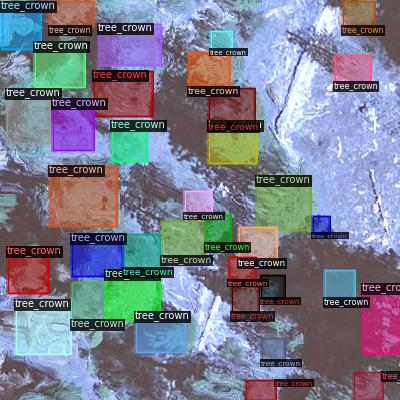

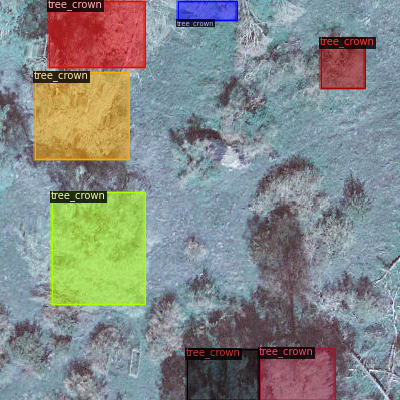

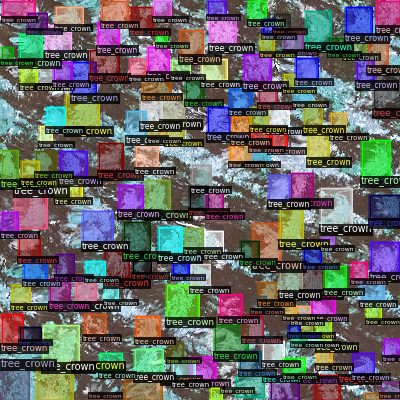

In [148]:
tree_dataset_train = get_tree_crowns_dict(tree_annotations, True)
for d in random.sample(tree_dataset_train, 3):
    img = cv2.cvtColor(cv2.imread(d["file_name"]), cv2.COLOR_BGR2RGB)
    visualizer = Visualizer(img[:, :, ::-1], metadata=tree_metadata, scale=1)
    out = visualizer.draw_dataset_dict(d)
    cv2_imshow(out.get_image()[:, :, ::-1])

In [132]:
tree_cfg = get_cfg()
tree_cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
tree_cfg.DATASETS.TRAIN = ("tree_train",)
tree_cfg.DATASETS.TEST = ()
tree_cfg.DATALOADER.NUM_WORKERS = 2
tree_cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")  # Let training initialize from model zoo
tree_cfg.SOLVER.IMS_PER_BATCH = 2
tree_cfg.SOLVER.BASE_LR = 0.005  # pick a good LR
tree_cfg.SOLVER.MAX_ITER = 1000    # 300 iterations seems good enough for this toy dataset; you will need to train longer for a practical dataset
tree_cfg.SOLVER.STEPS = []        # do not decay learning rate
tree_cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128   # faster, and good enough for this toy dataset (default: 512)
tree_cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1  # only has one class (ballon). (see https://detectron2.readthedocs.io/tutorials/datasets.html#update-the-config-for-new-datasets)
# NOTE: this config means the number of classes, but a few popular unofficial tutorials incorrect uses num_classes+1 here.

In [133]:
os.makedirs(tree_cfg.OUTPUT_DIR, exist_ok=True)
tree_trainer = DefaultTrainer(tree_cfg) 
tree_trainer.resume_or_load(resume=False)
tree_trainer.train()

[11/17 06:25:26 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

Skip loading parameter 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (81, 1024) in the checkpoint but (2, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (81,) in the checkpoint but (2,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (320, 1024) in the checkpoint but (4, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.bias' to the model due to incompatible shapes: (320,) in the checkpoint but (4,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.mask_head.predictor.weight' to the model due to incompatible shapes: (80, 256, 1, 1) in the checkpoint but (1, 256, 1, 1) in

[11/17 06:25:26 d2.engine.train_loop]: Starting training from iteration 0


/usr/local/lib/python3.7/dist-packages/detectron2/structures/image_list.py:88: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  max_size = (max_size + (stride - 1)) // stride * stride


[11/17 06:25:48 d2.utils.events]:  eta: 0:18:21  iter: 19  total_loss: 3.463  loss_cls: 0.6698  loss_box_reg: 0.7327  loss_mask: 0.6808  loss_rpn_cls: 1.178  loss_rpn_loc: 0.1439  time: 1.0721  data_time: 0.0288  lr: 9.9905e-05  max_mem: 2646M
[11/17 06:26:09 d2.utils.events]:  eta: 0:17:17  iter: 39  total_loss: 2.258  loss_cls: 0.5508  loss_box_reg: 0.7446  loss_mask: 0.5737  loss_rpn_cls: 0.2761  loss_rpn_loc: 0.1333  time: 1.0645  data_time: 0.0122  lr: 0.0001998  max_mem: 2646M
[11/17 06:26:30 d2.utils.events]:  eta: 0:16:45  iter: 59  total_loss: 2.051  loss_cls: 0.5143  loss_box_reg: 0.8014  loss_mask: 0.434  loss_rpn_cls: 0.1702  loss_rpn_loc: 0.1317  time: 1.0614  data_time: 0.0099  lr: 0.0002997  max_mem: 2646M
[11/17 06:26:50 d2.utils.events]:  eta: 0:16:11  iter: 79  total_loss: 1.972  loss_cls: 0.4993  loss_box_reg: 0.7607  loss_mask: 0.396  loss_rpn_cls: 0.1688  loss_rpn_loc: 0.1287  time: 1.0478  data_time: 0.0102  lr: 0.00039961  max_mem: 2646M
[11/17 06:27:11 d2.utils.

In [117]:
# Look at training curves in tensorboard:
%load_ext tensorboard
%tensorboard --logdir output

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


<IPython.core.display.Javascript object>

In [134]:
tree_cfg.MODEL.WEIGHTS = os.path.join(tree_cfg.OUTPUT_DIR, "model_final.pth")  # path to the model we just trained
tree_cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7   # set a custom testing threshold
tree_predictor = DefaultPredictor(tree_cfg)

/usr/local/lib/python3.7/dist-packages/detectron2/structures/image_list.py:88: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  max_size = (max_size + (stride - 1)) // stride * stride


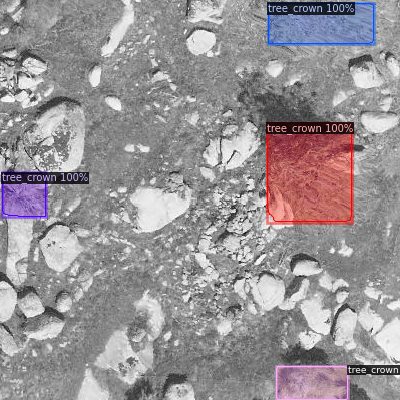

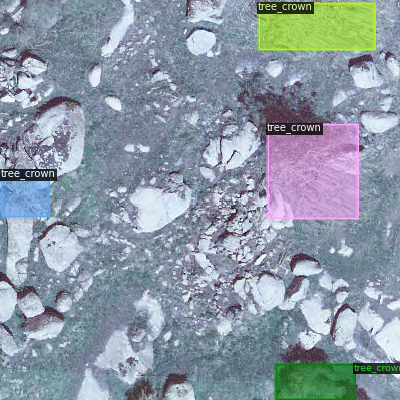

In [149]:
tree_dataset_test = get_tree_crowns_dict(tree_annotations, False)
for d in random.sample(tree_dataset_test, 1):    
    im = cv2.imread(d["file_name"])
    outputs = tree_predictor(im)  # format is documented at https://detectron2.readthedocs.io/tutorials/models.html#model-output-format
    v = Visualizer(im[:, :, ::-1],
                   metadata=tree_metadata, 
                   scale=1, 
                   instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels. This option is only available for segmentation models
    )
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2_imshow(out.get_image()[:, :, ::-1])

    img = cv2.cvtColor(cv2.imread(d["file_name"]), cv2.COLOR_BGR2RGB)
    visualizer = Visualizer(img[:, :, ::-1], metadata=tree_metadata, scale=1)
    out = visualizer.draw_dataset_dict(d)
    cv2_imshow(out.get_image()[:, :, ::-1])



/usr/local/lib/python3.7/dist-packages/detectron2/structures/image_list.py:88: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  max_size = (max_size + (stride - 1)) // stride * stride


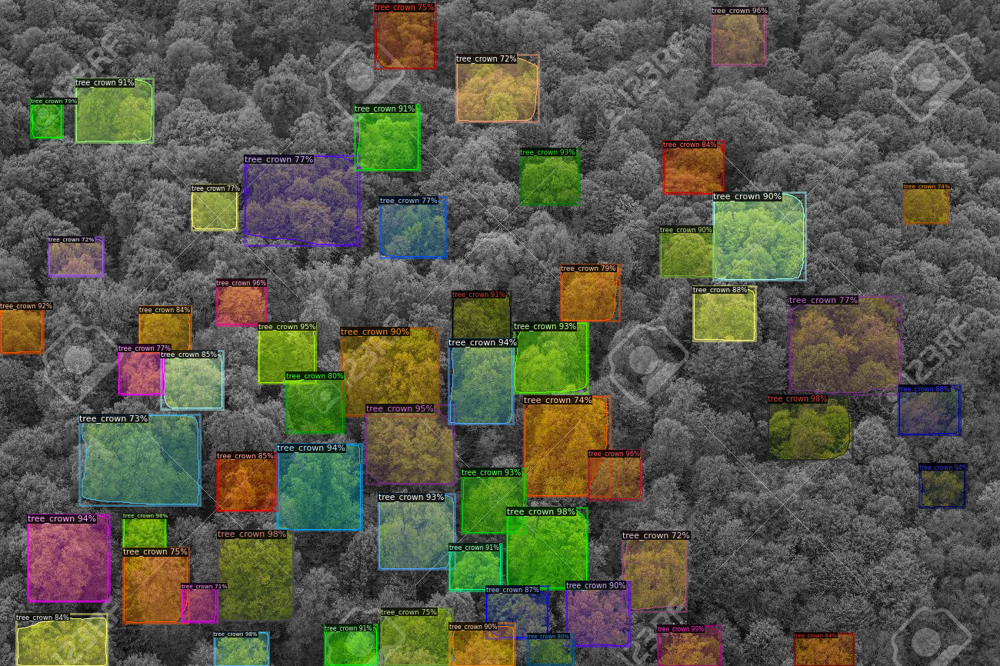

In [152]:
im = cv2.imread("/content/39766636-aerial-view-of-forest-in-poland.jpeg")
outputs = tree_predictor(im)  # format is documented at https://detectron2.readthedocs.io/tutorials/models.html#model-output-format
v = Visualizer(im[:, :, ::-1],
                metadata=tree_metadata, 
                scale=1, 
                instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels. This option is only available for segmentation models
)
out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2_imshow(out.get_image()[:, :, ::-1])